* [1.DataOverview](#1.DataOverview)
* [2.Visualization](#2.Visualization)
    * [2.1 Visualization for neighbourhood_group](#21)
    * [2.2 Visualization for Manhattan](#22)
        * [2.2.1 Visualization for the rooms with price <65 in Manhattan](#221)
        * [2.2.2 Visualization for the rooms with price between 65 and 80 in Manhattan](#222)
    * [2.3 Visualization for Brooklyn](#23)
        * [2.3.1 Visualization for the rooms with price between 10 and 65 in Brooklyn](#231)
    * [2.4 Visualization for Queens](#24)
        * [2.4.1 Visualization for the rooms with price is less than 100 in Queens](#241)
    * [2.5 Visualization for host](#25)
    * [2.6 Visualization for correlation](#26)
* [3.Regression_tree](#3.Regression_tree)

In [1]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import os
import seaborn as sns
import folium
from folium import plugins

In [2]:
os.listdir('../input/new-york-city-airbnb-open-data/')

['New_York_City_.png', 'AB_NYC_2019.csv']

# 1.DataOverview

In [3]:
data=pd.read_csv('../input/new-york-city-airbnb-open-data/AB_NYC_2019.csv')
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

Remove the missing value from 'name'.

In [5]:
data=data.dropna(subset=['name'])

# 2.Visualization

<h3 id="21">2.1&nbsp;Visualization&nbsp;for&nbsp;neighbourhood_group</h3>

In [6]:
data.neighbourhood_group.unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

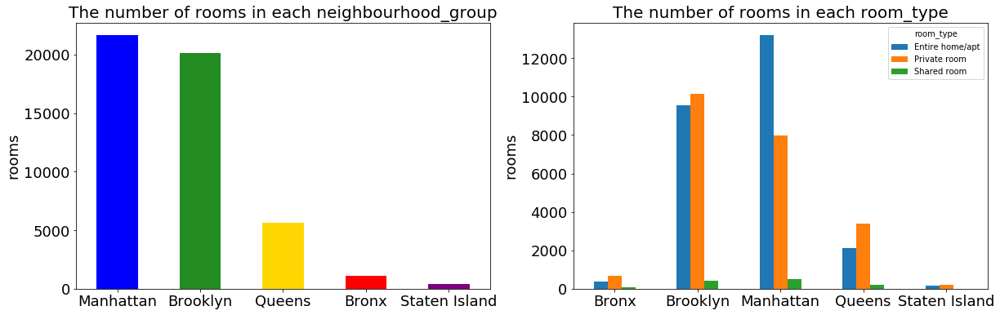

In [7]:
fig,ax=plt.subplots(1,2,figsize=(20,6))
clr = ("blue", "forestgreen", "gold", "red", "purple",'cadetblue','hotpink','orange','darksalmon','brown')
data.neighbourhood_group.value_counts().plot.bar(color=clr,ax=ax[0])
ax[0].set_title('The number of rooms in each neighbourhood_group',size=20)
ax[0].set_ylabel('rooms',size=18)
ax[0].tick_params(axis='x', rotation=360)
ax[0].tick_params(labelsize=18)

data.groupby(['neighbourhood_group','room_type'])['id'].agg('count').unstack('room_type').plot.bar(ax=ax[1])
ax[1].tick_params(axis='x', rotation=360)
ax[1].set_title('The number of rooms in each room_type',size=20)
ax[1].set_ylabel('rooms',size=18)
ax[1].set_xlabel('')
ax[1].tick_params(labelsize=18)

In [8]:
data.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

Text(0.5, 1.0, "Boxplot of Price for 'Entire home/apt' in each neighbourhood_group")

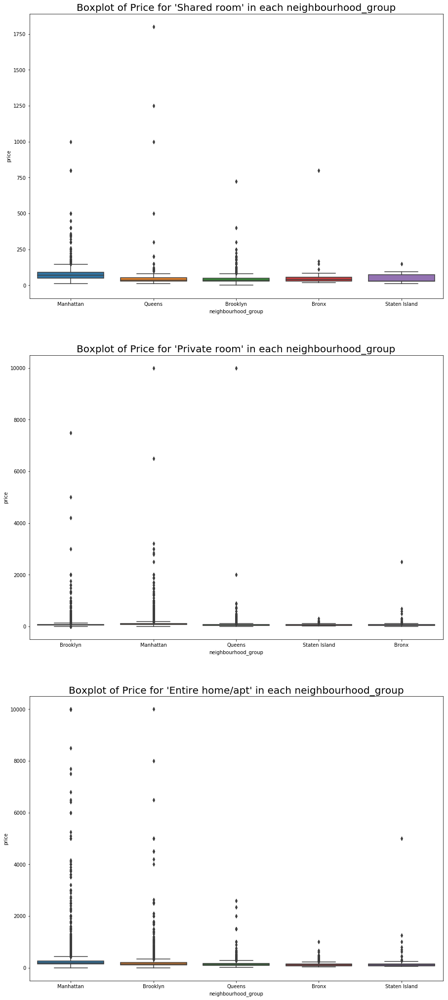

In [9]:
fig,ax=plt.subplots(3,1,figsize=(15,36))
sns.boxplot(x="neighbourhood_group", y="price", data=data[data.room_type=='Shared room'],ax=ax[0])
ax[0].set_title("Boxplot of Price for 'Shared room' in each neighbourhood_group",size=20)

sns.boxplot(x="neighbourhood_group", y="price", data=data[data.room_type=='Private room'],ax=ax[1])
ax[1].set_title("Boxplot of Price for 'Private room' in each neighbourhood_group",size=20)

sns.boxplot(x="neighbourhood_group", y="price", data=data[data.room_type=='Entire home/apt'],ax=ax[2])
ax[2].set_title("Boxplot of Price for 'Entire home/apt' in each neighbourhood_group",size=20)

<h3 id="22">2.2&nbsp;Visualization&nbsp;for&nbsp;Manhattan</h3>

In [10]:
data_manha=data[data.neighbourhood_group=='Manhattan']
data_manha.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220


In [11]:
data_manha.neighbourhood.unique()

array(['Midtown', 'Harlem', 'East Harlem', 'Murray Hill',
       "Hell's Kitchen", 'Upper West Side', 'Chinatown', 'West Village',
       'Chelsea', 'Inwood', 'East Village', 'Lower East Side', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Washington Heights',
       'Financial District', 'Morningside Heights', 'NoHo',
       'Flatiron District', 'Roosevelt Island', 'Greenwich Village',
       'Little Italy', 'Two Bridges', 'Nolita', 'Gramercy',
       'Theater District', 'Tribeca', 'Battery Park City', 'Civic Center',
       'Stuyvesant Town', 'Marble Hill'], dtype=object)

Text(0, 0.5, '')

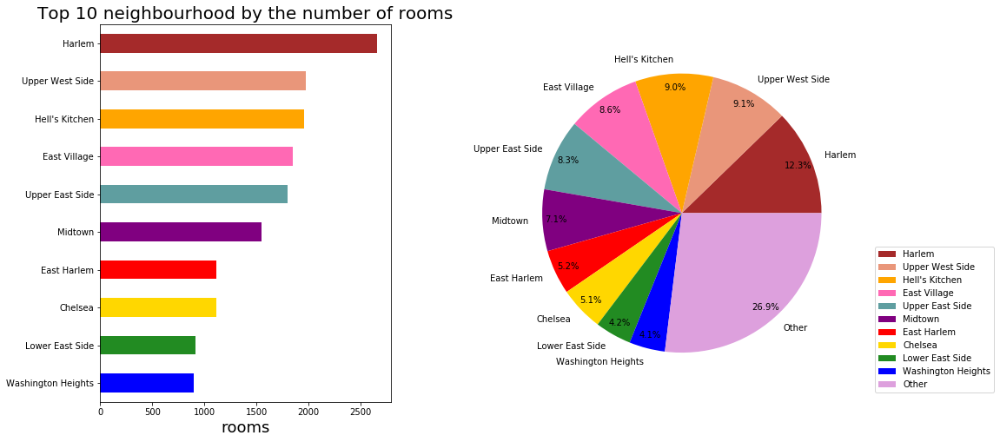

In [12]:
fig,ax=plt.subplots(1,2,figsize=(15,8))
clr = ("blue", "forestgreen", "gold", "red", "purple",'cadetblue','hotpink','orange','darksalmon','brown')
data_manha.neighbourhood.value_counts().sort_values(ascending=False)[:10].sort_values().plot(kind='barh',color=clr,ax=ax[0])
ax[0].set_title("Top 10 neighbourhood by the number of rooms",size=20)
ax[0].set_xlabel('rooms',size=18)


count=data_manha['neighbourhood'].value_counts()
groups=list(data_manha['neighbourhood'].value_counts().index)[:10]
counts=list(count[:10])
counts.append(count.agg(sum)-count[:10].agg('sum'))
groups.append('Other')
type_dict=pd.DataFrame({"group":groups,"counts":counts})
clr1=('brown','darksalmon','orange','hotpink','cadetblue','purple','red','gold','forestgreen','blue','plum')
qx = type_dict.plot(kind='pie', y='counts', labels=groups,colors=clr1,autopct='%1.1f%%', pctdistance=0.9, radius=1.2,ax=ax[1])
plt.legend(loc=0, bbox_to_anchor=(1.15,0.4)) 
plt.subplots_adjust(wspace =0.5, hspace =0)
plt.ylabel('')

<h3 id="221">2.2.1&nbsp;Visualization&nbsp;for&nbsp;the&nbsp;rooms&nbsp;with&nbsp;price&nbsp;<65&nbsp;in&nbsp;Manhattan</h3>

In [13]:
data_manha_65=data_manha[data_manha.price<65]
data_manha_65['label']=data_manha_65.apply(lambda x: (x['name'],'price:'+str(x['price'])),axis=1)
data_manha_65.head()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,label
28,9518,"SPACIOUS, LOVELY FURNISHED MANHATTAN BEDROOM",31374,Shon,Manhattan,Inwood,40.86482,-73.92106,Private room,44,3,108,2019-06-15,1.11,3,311,"(SPACIOUS, LOVELY FURNISHED MANHATTAN BEDROOM,..."
30,9668,front room/double bed,32294,Ssameer Or Trip,Manhattan,Harlem,40.82245,-73.95104,Private room,50,3,242,2019-06-01,2.04,3,355,"(front room/double bed, price:50)"
31,9704,Spacious 1 bedroom in luxe building,32045,Teri,Manhattan,Harlem,40.81305,-73.95466,Private room,52,2,88,2019-06-14,1.42,1,255,"(Spacious 1 bedroom in luxe building, price:52)"
33,9783,back room/bunk beds,32294,Ssameer Or Trip,Manhattan,Harlem,40.82130,-73.95318,Private room,50,3,273,2019-07-01,2.37,3,359,"(back room/bunk beds, price:50)"
39,12048,LowerEastSide apt share shortterm 1,7549,Ben,Manhattan,Lower East Side,40.71401,-73.98917,Shared room,40,1,214,2019-07-05,1.81,4,188,"(LowerEastSide apt share shortterm 1, price:40)"


According to this map,you can not only  see the comment,but also see the price for the room. 

In [14]:
Long=-73.92
Lat=40.86
manha_map=folium.Map([Lat,Long],zoom_start=12)

manha_rooms_map=plugins.MarkerCluster().add_to(manha_map)
for lat,lon,label in zip(data_manha_65.latitude,data_manha_65.longitude,data_manha_65.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(manha_rooms_map)
manha_map.add_child(manha_rooms_map)

manha_map

<h3 id="222">2.2.2 Visualization for the rooms with price between 65 and 80 in Manhattan</h3>

In [15]:
data_manha_65_80=data_manha.loc[(data_manha['price'] >=65) & (data_manha['price'] <80)]
data_manha_65_80['label']=data_manha_65_80.apply(lambda x: (x['name'],'price:'+str(x['price'])),axis=1)
Long=-73.92
Lat=40.86
manha_65_80_map=folium.Map([Lat,Long],zoom_start=12)

manha_65_80_rooms_map=plugins.MarkerCluster().add_to(manha_65_80_map)
for lat,lon,label in zip(data_manha_65_80.latitude,data_manha_65_80.longitude,data_manha_65_80.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(manha_65_80_rooms_map)
manha_65_80_map.add_child(manha_65_80_rooms_map)

manha_65_80_map

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<h3 id="23">2.3&nbsp;Visualization&nbsp;for&nbsp;Brooklyn</h3>

In [16]:
data_Brooklyn=data[data.neighbourhood_group=='Brooklyn']
data_Brooklyn.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
12,5803,"Lovely Room 1, Garden, Best Area, Legal rental",9744,Laurie,Brooklyn,South Slope,40.66829,-73.98779,Private room,89,4,167,2019-06-24,1.34,3,314
15,6848,Only 2 stops to Manhattan studio,15991,Allen & Irina,Brooklyn,Williamsburg,40.70837,-73.95352,Entire home/apt,140,2,148,2019-06-29,1.20,1,46


In [17]:
data_Brooklyn.neighbourhood.unique()

array(['Kensington', 'Clinton Hill', 'Bedford-Stuyvesant', 'South Slope',
       'Williamsburg', 'Fort Greene', 'Crown Heights', 'Park Slope',
       'Windsor Terrace', 'Greenpoint', 'Bushwick', 'Flatbush',
       'Prospect-Lefferts Gardens', 'Prospect Heights',
       'Brooklyn Heights', 'Carroll Gardens', 'Gowanus', 'Flatlands',
       'Cobble Hill', 'Boerum Hill', 'DUMBO', 'East Flatbush',
       'Gravesend', 'East New York', 'Sheepshead Bay', 'Fort Hamilton',
       'Bensonhurst', 'Sunset Park', 'Brighton Beach', 'Cypress Hills',
       'Bay Ridge', 'Columbia St', 'Vinegar Hill', 'Canarsie',
       'Borough Park', 'Downtown Brooklyn', 'Midwood', 'Red Hook',
       'Dyker Heights', 'Sea Gate', 'Navy Yard', 'Brownsville',
       'Manhattan Beach', 'Bergen Beach', 'Coney Island', 'Bath Beach',
       'Mill Basin'], dtype=object)

Text(0, 0.5, '')

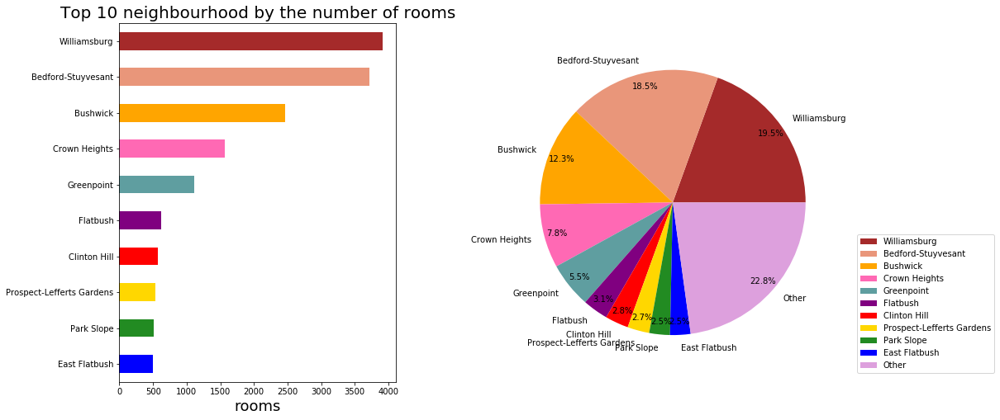

In [18]:
fig,ax=plt.subplots(1,2,figsize=(15,8))
clr = ("blue", "forestgreen", "gold", "red", "purple",'cadetblue','hotpink','orange','darksalmon','brown')
data_Brooklyn.neighbourhood.value_counts().sort_values(ascending=False)[:10].sort_values().plot(kind='barh',color=clr,ax=ax[0])
ax[0].set_title("Top 10 neighbourhood by the number of rooms",size=20)
ax[0].set_xlabel('rooms',size=18)


count=data_Brooklyn['neighbourhood'].value_counts()
groups=list(data_Brooklyn['neighbourhood'].value_counts().index)[:10]
counts=list(count[:10])
counts.append(count.agg(sum)-count[:10].agg('sum'))
groups.append('Other')
type_dict=pd.DataFrame({"group":groups,"counts":counts})
clr1=('brown','darksalmon','orange','hotpink','cadetblue','purple','red','gold','forestgreen','blue','plum')
qx = type_dict.plot(kind='pie', y='counts', labels=groups,colors=clr1,autopct='%1.1f%%', pctdistance=0.9, radius=1.2,ax=ax[1])
plt.legend(loc=0, bbox_to_anchor=(1.15,0.4)) 
plt.subplots_adjust(wspace =0.5, hspace =0)
plt.ylabel('')

<h3 id="231">2.3.1 Visualization for the rooms with price between 10 and 65 in Brooklyn</h3>

In [19]:
data_Brooklyn_10_65=data_Brooklyn.loc[(data_Brooklyn['price'] >=10) & (data_Brooklyn['price'] <65)][:2000]
data_Brooklyn_10_65['label']=data_Brooklyn_10_65.apply(lambda x: (x['name'],'price:'+str(x['price'])),axis=1)
data_Brooklyn_10_65.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,label
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0,"(BlissArtsSpace!, price:60)"
25,8505,Sunny Bedroom Across Prospect Park,25326,Gregory,Brooklyn,Windsor Terrace,40.65599,-73.97519,Private room,60,1,19,2019-06-23,1.37,2,85,"(Sunny Bedroom Across Prospect Park, price:60)"
32,9782,Loft in Williamsburg Area w/ Roof,32169,Andrea,Brooklyn,Greenpoint,40.72219,-73.93762,Private room,55,4,197,2019-06-15,1.65,3,284,"(Loft in Williamsburg Area w/ Roof, price:55)"
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365,"(Clean and Quiet in Brooklyn, price:35)"
58,15338,Room in Greenpoint Loft w/ Roof,32169,Andrea,Brooklyn,Greenpoint,40.72401,-73.93788,Private room,49,4,138,2019-06-04,1.19,3,320,"(Room in Greenpoint Loft w/ Roof, price:49)"


In [20]:
Long=-73.94
Lat=40.72
Brooklyn_10_65_map=folium.Map([Lat,Long],zoom_start=12)

Brooklyn_10_65_rooms_map=plugins.MarkerCluster().add_to(Brooklyn_10_65_map)
for lat,lon,label in zip(data_Brooklyn_10_65.latitude,data_Brooklyn_10_65.longitude,data_Brooklyn_10_65.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(Brooklyn_10_65_rooms_map)
Brooklyn_10_65_map.add_child(Brooklyn_10_65_rooms_map)

Brooklyn_10_65_map

<h3 id="24">2.4&nbsp;Visualization&nbsp;for&nbsp;Queens</h3>

In [21]:
data_Queens=data[data.neighbourhood_group=='Queens']
data_Queens.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
46,12937,"1 Stop fr. Manhattan! Private Suite,Landmark B...",50124,Orestes,Queens,Long Island City,40.74771,-73.94740,Private room,130,3,248,2019-07-01,2.25,1,215
77,18198,Little King of Queens,70091,Justin,Queens,Woodside,40.75038,-73.90334,Private room,70,30,25,2019-05-31,0.22,1,324
143,32363,Fully Furnished Basement Apartment,140025,Fredah,Queens,Flushing,40.74028,-73.83168,Private room,140,2,1,2011-09-19,0.01,1,1
161,39593,"A room w/ a Manhattan view, longer stay",110506,Myung,Queens,Sunnyside,40.74559,-73.92313,Private room,79,30,28,2019-04-12,0.26,1,126
181,45910,Beautiful Queens Brownstone! - 5BR,204539,Mark,Queens,Ridgewood,40.70382,-73.89797,Entire home/apt,350,8,10,2019-05-12,0.11,5,365


In [22]:
data_Queens.neighbourhood.unique()

array(['Long Island City', 'Woodside', 'Flushing', 'Sunnyside',
       'Ridgewood', 'Jamaica', 'Middle Village', 'Ditmars Steinway',
       'Astoria', 'Queens Village', 'Rockaway Beach', 'Forest Hills',
       'Elmhurst', 'Jackson Heights', 'St. Albans', 'Rego Park',
       'Briarwood', 'Ozone Park', 'East Elmhurst', 'Arverne',
       'Cambria Heights', 'Bayside', 'Kew Gardens', 'College Point',
       'Glendale', 'Richmond Hill', 'Bellerose', 'Maspeth', 'Woodhaven',
       'Kew Gardens Hills', 'Bay Terrace', 'Whitestone', 'Bayswater',
       'Fresh Meadows', 'Springfield Gardens', 'Howard Beach',
       'Belle Harbor', 'Jamaica Estates', 'Far Rockaway',
       'South Ozone Park', 'Corona', 'Neponsit', 'Laurelton',
       'Holliswood', 'Rosedale', 'Edgemere', 'Jamaica Hills', 'Hollis',
       'Douglaston', 'Little Neck', 'Breezy Point'], dtype=object)

Text(0, 0.5, '')

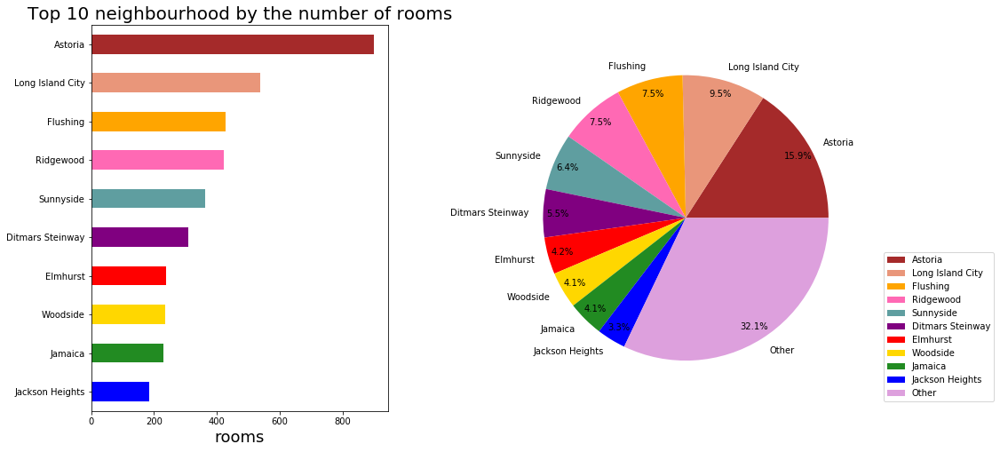

In [23]:
fig,ax=plt.subplots(1,2,figsize=(15,8))
clr = ("blue", "forestgreen", "gold", "red", "purple",'cadetblue','hotpink','orange','darksalmon','brown')
data_Queens.neighbourhood.value_counts().sort_values(ascending=False)[:10].sort_values().plot(kind='barh',color=clr,ax=ax[0])
ax[0].set_title("Top 10 neighbourhood by the number of rooms",size=20)
ax[0].set_xlabel('rooms',size=18)


count=data_Queens['neighbourhood'].value_counts()
groups=list(data_Queens['neighbourhood'].value_counts().index)[:10]
counts=list(count[:10])
counts.append(count.agg(sum)-count[:10].agg('sum'))
groups.append('Other')
type_dict=pd.DataFrame({"group":groups,"counts":counts})
clr1=('brown','darksalmon','orange','hotpink','cadetblue','purple','red','gold','forestgreen','blue','plum')
qx = type_dict.plot(kind='pie', y='counts', labels=groups,colors=clr1,autopct='%1.1f%%', pctdistance=0.9, radius=1.2,ax=ax[1])
plt.legend(loc=0, bbox_to_anchor=(1.15,0.4)) 
plt.subplots_adjust(wspace =0.5, hspace =0)
plt.ylabel('')

<h3 id="241">2.4.1 Visualization for the rooms with price is less than 100 in Queens</h3>

In [24]:
data_Queens_100_1=data_Queens.loc[(data_Queens['price'] <100)][:2000]
data_Queens_100_1['label']=data_Queens_100_1.apply(lambda x: (x['name'],'price:'+str(x['price'])),axis=1)
data_Queens_100_1.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,label
77,18198,Little King of Queens,70091,Justin,Queens,Woodside,40.75038,-73.90334,Private room,70,30,25,2019-05-31,0.22,1,324,"(Little King of Queens, price:70)"
161,39593,"A room w/ a Manhattan view, longer stay",110506,Myung,Queens,Sunnyside,40.74559,-73.92313,Private room,79,30,28,2019-04-12,0.26,1,126,"(A room w/ a Manhattan view, longer stay, pric..."
196,51850,( F) Excellent/Pvt Rm,27848,Jullett,Queens,Jamaica,40.67252,-73.76597,Private room,55,2,52,2019-05-20,0.49,2,365,"(( F) Excellent/Pvt Rm, price:55)"
199,53469,cozy studio with parking spot,204539,Mark,Queens,Middle Village,40.71722,-73.87856,Entire home/apt,98,30,33,2015-05-09,0.31,5,240,"(cozy studio with parking spot, price:98)"
257,63360,Safe cute near subway& Manhattan NY NY retro s...,307962,Dennis & Naoko,Queens,Astoria,40.75384,-73.91433,Entire home/apt,99,5,441,2019-06-24,4.50,1,226,(Safe cute near subway& Manhattan NY NY retro ...


In [25]:
Long=-73.80
Lat=40.70
data_Queens_100_1_map=folium.Map([Lat,Long],zoom_start=12)

data_Queens_100_1_rooms_map=plugins.MarkerCluster().add_to(data_Queens_100_1_map)
for lat,lon,label in zip(data_Queens_100_1.latitude,data_Queens_100_1.longitude,data_Queens_100_1.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_Queens_100_1_rooms_map)
data_Queens_100_1_map.add_child(data_Queens_100_1_rooms_map)

data_Queens_100_1_map

In [26]:
data_Queens_100_2=data_Queens.loc[(data_Queens['price'] <100)][2000:2800]
data_Queens_100_2['label']=data_Queens_100_2.apply(lambda x: (x['name'],'price:'+str(x['price'])),axis=1)
Long=-73.80
Lat=40.70
data_Queens_100_2_map=folium.Map([Lat,Long],zoom_start=12)

data_Queens_100_2_rooms_map=plugins.MarkerCluster().add_to(data_Queens_100_2_map)
for lat,lon,label in zip(data_Queens_100_2.latitude,data_Queens_100_2.longitude,data_Queens_100_2.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_Queens_100_2_rooms_map)
data_Queens_100_2_map.add_child(data_Queens_100_2_rooms_map)

data_Queens_100_2_map

In [27]:
data_Queens_100_3=data_Queens.loc[(data_Queens['price'] <100)][2801:-1]
data_Queens_100_3['label']=data_Queens_100_3.apply(lambda x: (x['name'],'price:'+str(x['price'])),axis=1)
Long=-73.80
Lat=40.70
data_Queens_100_3_map=folium.Map([Lat,Long],zoom_start=12)

data_Queens_100_3_rooms_map=plugins.MarkerCluster().add_to(data_Queens_100_3_map)
for lat,lon,label in zip(data_Queens_100_3.latitude,data_Queens_100_3.longitude,data_Queens_100_3.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_Queens_100_3_rooms_map)
data_Queens_100_3_map.add_child(data_Queens_100_3_rooms_map)

data_Queens_100_3_map

<h3 id="25">2.5 Visualization for host</h3>

Text(0, 0.5, '')

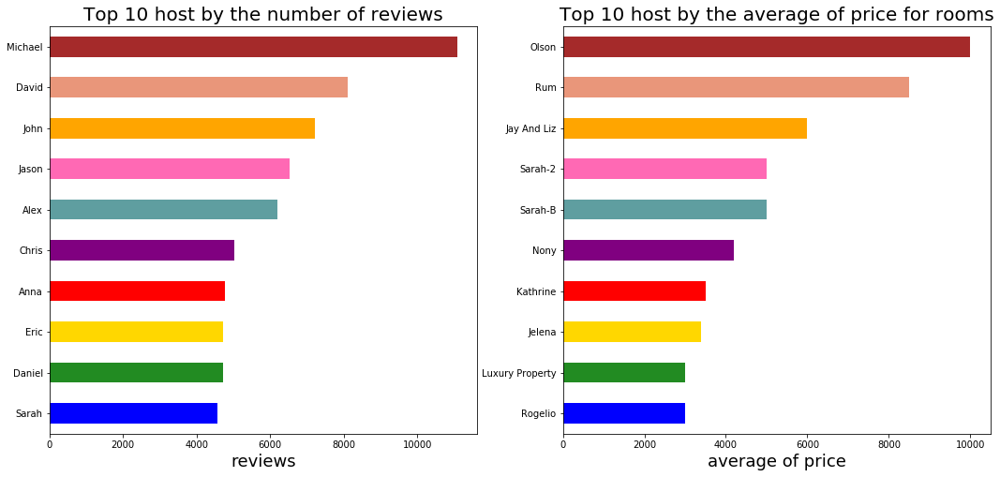

In [28]:
fig,ax=plt.subplots(1,2,figsize=(18,8))
clr = ("blue", "forestgreen", "gold", "red", "purple",'cadetblue','hotpink','orange','darksalmon','brown')
data.groupby(['host_name'])['number_of_reviews'].agg('sum').sort_values(ascending=False)[:10].sort_values().plot(kind='barh',color=clr,ax=ax[0])
ax[0].set_title("Top 10 host by the number of reviews",size=20)
ax[0].set_xlabel('reviews',size=18)
ax[0].set_ylabel('')

data.groupby(['host_name'])['price'].agg('mean').sort_values(ascending=False)[:10].sort_values().plot(kind='barh',color=clr,ax=ax[1])
ax[1].set_title("Top 10 host by the average of price for rooms",size=20)
ax[1].set_xlabel('average of price',size=18)
ax[1].set_ylabel('')

<h3 id="26">2.6 Visualization for correlation</h3>

Text(0.5, 1.0, 'correlation plot')

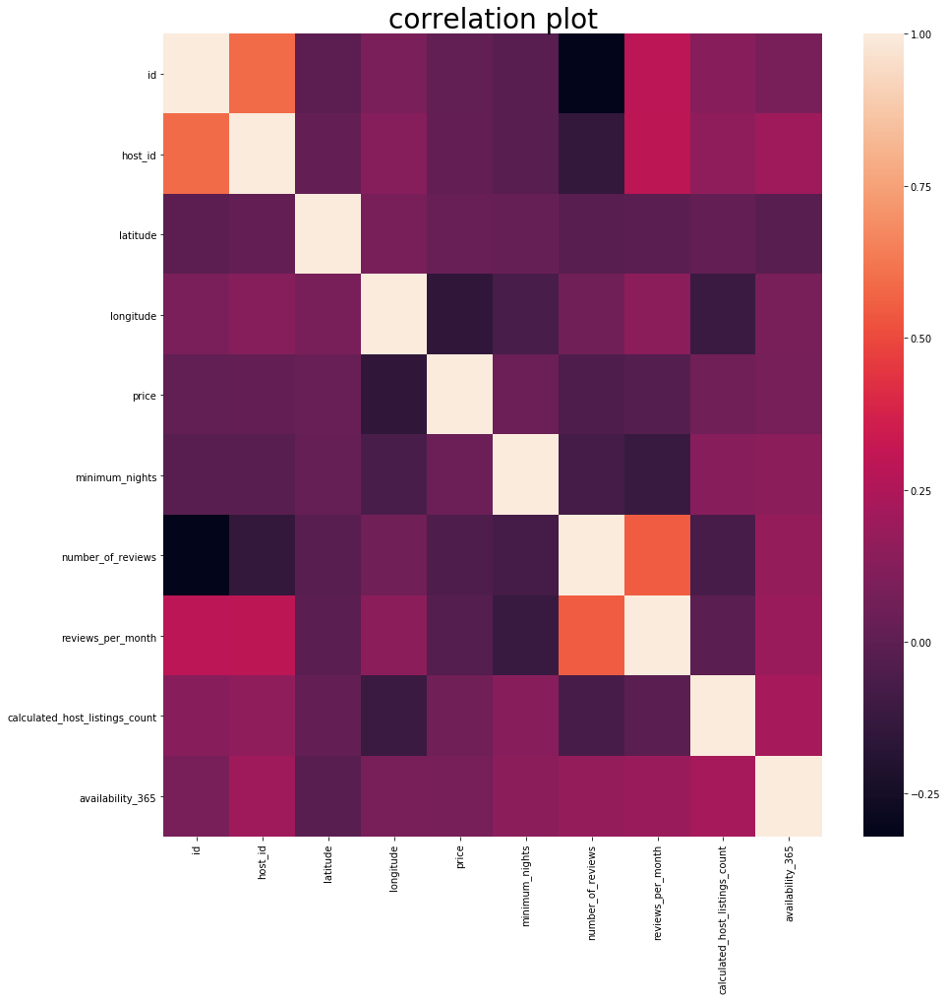

In [29]:
plt.figure(figsize=(15,15))
corr = data.corr()
sns.heatmap(corr, xticklabels=corr.columns,yticklabels=corr.columns)
plt.title("correlation plot",size=28)

# 3.Regression_tree

I use the regression tree to predict the price of room,and the variables include

'neighbourhood_group','neighbourhood','room_type','minimum_nights',and 'number_of_reviews'

I use the data whcih price is between 90 and 180. The MAD is about 0.16 that mean the regression tree is not bad.

In [30]:
data_tree=data[['neighbourhood_group','neighbourhood','room_type','minimum_nights','number_of_reviews','price']]
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
data_tree['neighbourhood_group_new'] = labelencoder.fit_transform(data_tree['neighbourhood_group'])
data_tree['neighbourhood_new'] = labelencoder.fit_transform(data_tree['neighbourhood'])
data_tree['room_type_new'] = labelencoder.fit_transform(data_tree['room_type'])
data_tree.head()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: h

,neighbourhood_group,neighbourhood,room_type,minimum_nights,number_of_reviews,price,neighbourhood_group_new,neighbourhood_new,room_type_new
0,Brooklyn,Kensington,Private room,1,9,149,1,108,1
1,Manhattan,Midtown,Entire home/apt,1,45,225,2,127,0
2,Manhattan,Harlem,Private room,3,0,150,2,94,1
3,Brooklyn,Clinton Hill,Entire home/apt,1,270,89,1,41,0
4,Manhattan,East Harlem,Entire home/apt,10,9,80,2,61,0


In [31]:
data_tree=data_tree[data_tree.price<=180]
data_tree=data_tree[data_tree.price>=90]
len(data_tree)

18574

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
x_train,x_test,y_train,y_test=train_test_split(data_tree[['neighbourhood_group_new','neighbourhood_new','room_type_new','minimum_nights','number_of_reviews']],data_tree[['price']],test_size=0.1,random_state=0)
Reg_tree=DecisionTreeRegressor(criterion='mse',max_depth=3,random_state=0)
Reg_tree=Reg_tree.fit(x_train,y_train)
y=y_test['price']
predict=Reg_tree.predict(x_test)
print("median absolute deviation (MAD): ",np.mean(abs(np.multiply(np.array(y_test.T-predict),np.array(1/y_test)))))

median absolute deviation (MAD):  0.1663883878567311


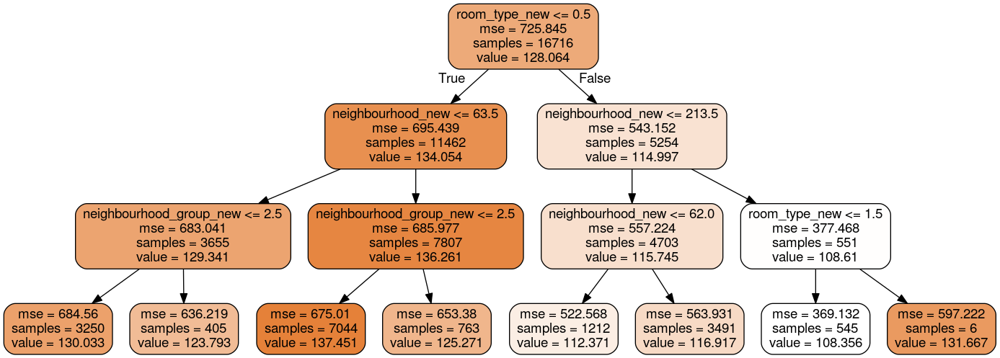

In [33]:
from subprocess import check_call
from PIL import Image, ImageDraw, ImageFont
from IPython.display import Image as PImage
from sklearn.tree import export_graphviz
with open("tree1.dot", 'w') as f:
     f = export_graphviz(Reg_tree,
                              out_file=f,
                              max_depth = 3,
                              impurity = True,
                              feature_names = ['neighbourhood_group_new','neighbourhood_new','room_type_new','minimum_nights','number_of_reviews'],
                              rounded = True,
                              filled= True )
check_call(['dot','-Tpng','tree1.dot','-o','tree1.png'])
img = Image.open("tree1.png")
draw = ImageDraw.Draw(img)
img.save('sample-out.png')
PImage("sample-out.png")